# Seqana challenge

## Flow of the solution
 Getting data
 
 Understanding the data
 
 Feature Selection
 
 Exploratory Data Analysis
 
 Data Visualization
 
 Model building
 
 Comparing performances of models
 
 PCA, Ridge, LASSO on Linear regression
 


### Importing all necessary libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing, svm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeRegressor
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import seaborn as sns

# Importing dataset

In [2]:
df = pd.read_csv('seqana_data.csv')
df.head(10)

,year,dem_nasa_dem30,dem_merit,dem_gmted,dem_srtm90_v4,dem_nasa_srtm30,dem_usgs_ned,terrain_topo_div_alos_constant,terrain_mtpi_alos_AVE,terrain_chili_alos_constant,...,sur_refl_b02_mean_sampling_year,sur_refl_b03_mean_sampling_year,sur_refl_b07_mean_sampling_year,evi_std_sampling_year,ndvi_std_sampling_year,sur_refl_b01_std_sampling_year,sur_refl_b02_std_sampling_year,sur_refl_b03_std_sampling_year,sur_refl_b07_std_sampling_year,soc_stock_t_ha
0,2012,894,899.792969,898,892,894,895.900574,0.306919,-4,183,...,3374.608696,1089.260870,1546.869565,1574.503874,2215.650847,1688.021295,1375.511632,1220.169482,654.961158,68.793925
1,2011,61,56.898190,58,58,57,58.000286,0.123088,-7,181,...,2709.608696,374.478261,1166.391304,1582.043952,1427.600306,307.310126,999.502956,167.002686,501.502718,87.265779
2,2011,92,92.471191,89,91,90,92.729630,0.046061,-1,181,...,3195.043478,414.347826,1221.347826,1927.965549,1960.699712,583.722087,1090.225101,322.372259,434.762277,96.650384
3,2011,1560,1572.300049,1622,1570,1549,1547.678345,0.781243,-17,160,...,4063.727273,1790.043478,928.956522,1010.631962,1903.293570,2179.134552,2019.112468,1884.017720,472.453507,68.400738
4,2011,1176,1175.498901,1179,1176,1176,1170.957031,0.210475,-2,181,...,2652.260870,1022.217391,864.565217,646.826519,1687.594992,922.467112,857.199362,1366.888502,303.002824,35.314235
5,2011,1029,1028.536987,1027,1027,1028,1028.392944,0.028306,0,178,...,2687.521739,1100.521739,1491.043478,1150.011155,1733.181903,1302.117995,884.666649,1622.403993,397.956539,54.573206
6,2011,735,732.780273,729,737,734,739.032532,0.271566,13,175,...,2004.173913,582.043478,1765.521739,300.858883,462.926552,114.616529,209.765378,81.038419,234.183857,20.430993
7,2011,20,16.020348,17,16,18,14.544247,0.235374,-15,186,...,3590.608696,357.608696,605.913043,893.710001,1053.063140,464.632491,672.869347,382.318256,182.311650,241.694124
8,2011,1019,1022.953857,1021,1021,1018,1021.998779,0.042132,-2,180,...,3888.260870,1442.826087,1305.000000,2228.092090,2660.591219,2160.611603,1388.968264,2294.104433,511.719028,68.659477
9,2011,764,764.236450,754,763,762,767.776245,0.504665,-15,189,...,2180.565217,542.347826,1379.521739,506.921153,922.594214,226.774060,161.293021,95.346549,184.722364,69.076416


## Statistical Analysis

In [3]:
# checking informations about datatypes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5091 entries, 0 to 5090
Columns: 306 entries, year to soc_stock_t_ha
dtypes: float64(212), int64(94)
memory usage: 11.9 MB


In [5]:
df.describe(include="all")           #statistical description of the data

,year,dem_nasa_dem30,dem_merit,dem_gmted,dem_srtm90_v4,dem_nasa_srtm30,dem_usgs_ned,terrain_topo_div_alos_constant,terrain_mtpi_alos_AVE,terrain_chili_alos_constant,...,sur_refl_b02_mean_sampling_year,sur_refl_b03_mean_sampling_year,sur_refl_b07_mean_sampling_year,evi_std_sampling_year,ndvi_std_sampling_year,sur_refl_b01_std_sampling_year,sur_refl_b02_std_sampling_year,sur_refl_b03_std_sampling_year,sur_refl_b07_std_sampling_year,soc_stock_t_ha
count,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,...,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000
mean,2011.011589,703.000982,702.989512,704.887056,704.098409,704.304066,702.360047,0.171150,-1.472009,196.266352,...,2926.502814,934.478293,1443.624366,1276.086012,1630.338114,1065.661213,1068.488921,1036.451850,453.205834,69.399018
std,0.285303,689.395483,689.818076,689.329857,689.650488,689.572815,689.939886,0.173190,15.523306,19.435374,...,576.318969,709.491148,646.012703,669.566579,828.002647,1005.472648,618.375897,1079.210268,197.820808,67.241177
min,2011.000000,-64.000000,-62.485870,-62.000000,-64.000000,-64.000000,-64.751762,0.006211,-146.000000,65.000000,...,884.869565,57.043478,209.086957,43.458035,32.174549,44.805950,121.464499,25.795410,72.230034,0.178608
25%,2011.000000,178.500000,177.082237,179.000000,179.000000,179.000000,177.300896,0.058714,-4.000000,184.000000,...,2531.978261,382.565217,991.347826,716.760909,970.811955,222.691322,588.573861,107.901579,305.694851,30.201763
50%,2011.000000,383.000000,382.266815,384.000000,383.000000,381.000000,381.222198,0.103695,0.000000,199.000000,...,2842.695652,736.913043,1322.608696,1264.965743,1594.603804,639.540645,924.875167,649.356386,415.923707,49.241095
75%,2011.000000,1228.000000,1228.776917,1230.000000,1229.000000,1228.500000,1229.918152,0.212986,2.000000,210.000000,...,3244.173913,1234.739130,1741.195652,1831.894627,2293.518117,1741.368234,1392.175076,1767.075432,572.038427,82.367462
max,2019.000000,3531.000000,3521.041748,3523.000000,3580.000000,3536.000000,3522.890137,1.000000,150.000000,252.000000,...,5668.818182,4272.304348,4684.826087,3406.645239,3559.256708,3867.800669,3193.912846,4049.046509,1249.752010,497.756299


In [6]:
df.dtypes                   #data types of all attributes

year                                int64
dem_nasa_dem30                      int64
dem_merit                         float64
dem_gmted                           int64
dem_srtm90_v4                       int64
                                   ...   
sur_refl_b01_std_sampling_year    float64
sur_refl_b02_std_sampling_year    float64
sur_refl_b03_std_sampling_year    float64
sur_refl_b07_std_sampling_year    float64
soc_stock_t_ha                    float64
Length: 306, dtype: object

# Detecting and dropping duplicates

In [9]:
print("Number of duplicates: ", df.duplicated().sum())
print("Unique values per column:")
df.nunique()

Number of duplicates:  0
Unique values per column:


year                                 4
dem_nasa_dem30                    1800
dem_merit                         5085
dem_gmted                         1811
dem_srtm90_v4                     1779
                                  ... 
sur_refl_b01_std_sampling_year    5083
sur_refl_b02_std_sampling_year    5083
sur_refl_b03_std_sampling_year    5073
sur_refl_b07_std_sampling_year    5074
soc_stock_t_ha                    5091
Length: 306, dtype: int64

### There are no duplicates in the data

# Detecting null values

In [11]:
df.isnull().sum()

year                              0
dem_nasa_dem30                    0
dem_merit                         0
dem_gmted                         0
dem_srtm90_v4                     0
                                 ..
sur_refl_b01_std_sampling_year    0
sur_refl_b02_std_sampling_year    0
sur_refl_b03_std_sampling_year    0
sur_refl_b07_std_sampling_year    0
soc_stock_t_ha                    0
Length: 306, dtype: int64

### There are no null values in the data

# Data visualization

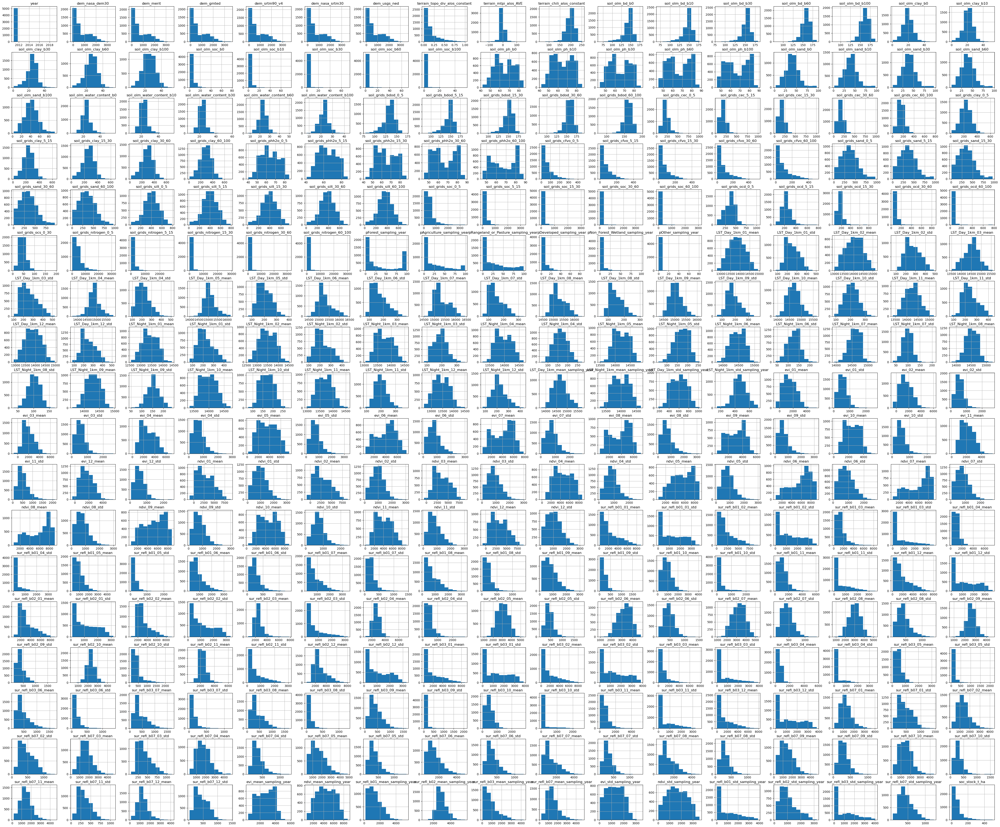

In [12]:
df.hist(figsize=(60,50))
plt.show()

<AxesSubplot:>

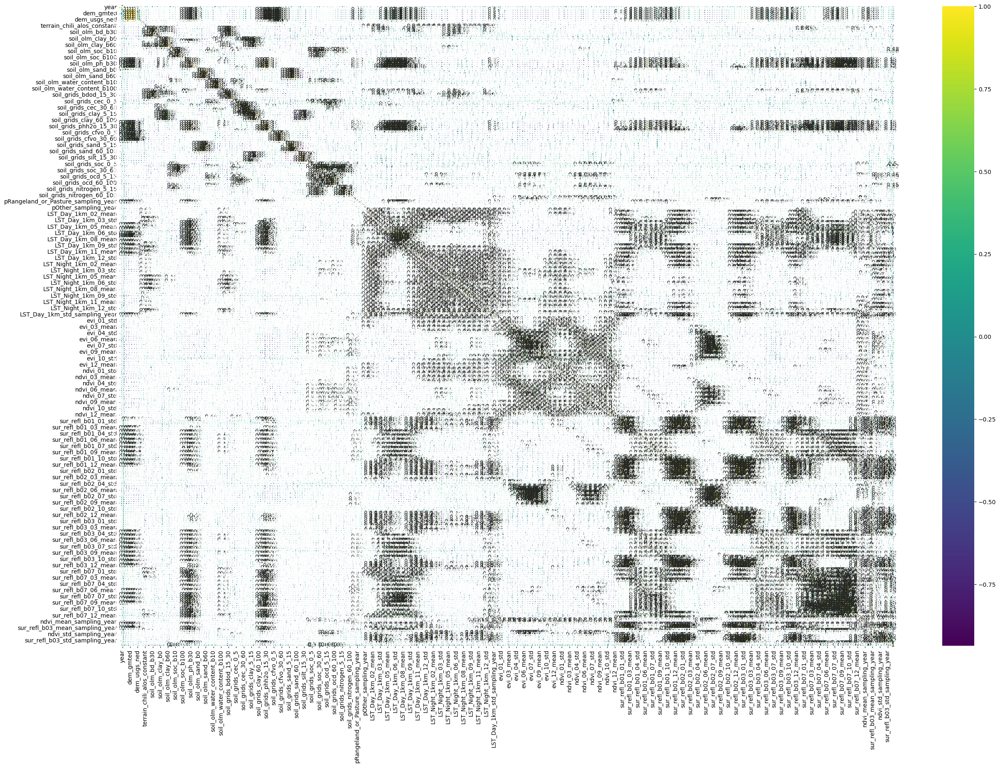

In [13]:
plt.figure(figsize=[30,20])
sns.heatmap(df.corr(), annot = True, cmap = 'viridis')

### As we can see, there are too many features. It's showing high multicollinearity between the features

<AxesSubplot:xlabel='soc_stock_t_ha', ylabel='Density'>

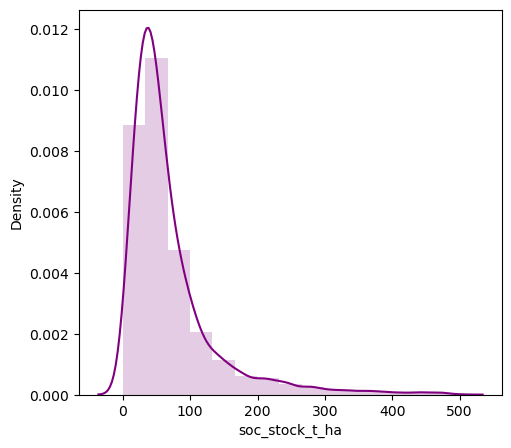

In [14]:
plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
sns.distplot(df['soc_stock_t_ha'],color="purple",bins=15,hist_kws={'alpha':0.2})

### The target variable 'soc_stock_t_ha' is having long right tail

### To determine the features with highest contribution in predicting the target I am using VIF to detect multicollinarity

## Choosing best features based on VIF

In [15]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(df):
    vif = pd.DataFrame()
    vif["features"] = df.columns
    vif["VIF_Value"] = [variance_inflation_factor(df.values,i) for i in range(df.shape[1])]
    
    return(vif)

features = df.iloc[:,:-1]
vif_df = calculate_vif(features)

vif_df['VIF_Value'] = vif_df['VIF_Value'].astype('int64') 
vif_df = vif_df.sort_values(by=['VIF_Value'], ascending=True)
vif_df.head(150)

# these are the best features based on Variance Inflation Factor
l = vif_df.head(150)['features'].values
l

array(['pOther_sampling_year', 'terrain_mtpi_alos_AVE',
       'pNon_Forest_Wetland_sampling_year', 'pDeveloped_sampling_year',
       'terrain_topo_div_alos_constant', 'soil_olm_soc_b100',
       'pAgriculture_sampling_year',
       'pRangeland_or_Pasture_sampling_year', 'sur_refl_b07_10_std',
       'sur_refl_b03_08_std', 'sur_refl_b03_05_std', 'soil_olm_soc_b60',
       'soil_grids_nitrogen_0_5', 'sur_refl_b03_09_std',
       'sur_refl_b03_06_std', 'soil_grids_soc_60_100', 'soil_olm_soc_b30',
       'soil_grids_nitrogen_60_100', 'sur_refl_b03_07_std',
       'pForest_sampling_year', 'soil_grids_soc_0_5',
       'soil_grids_ocd_60_100', 'sur_refl_b07_std_sampling_year',
       'soil_olm_soc_b0', 'soil_grids_soc_15_30',
       'soil_grids_nitrogen_5_15', 'sur_refl_b07_09_std',
       'sur_refl_b07_11_std', 'soil_grids_soc_5_15',
       'sur_refl_b07_01_std', 'sur_refl_b01_05_std', 'soil_olm_soc_b10',
       'sur_refl_b01_08_std', 'sur_refl_b01_07_std',
       'soil_grids_soc_30_60', '

In [3]:
final_df = df[['pOther_sampling_year', 'terrain_mtpi_alos_AVE',
       'pNon_Forest_Wetland_sampling_year', 'pDeveloped_sampling_year',
       'terrain_topo_div_alos_constant', 'soil_olm_soc_b100',
       'pAgriculture_sampling_year',
       'pRangeland_or_Pasture_sampling_year', 'sur_refl_b07_10_std',
       'sur_refl_b03_08_std', 'sur_refl_b03_05_std', 'soil_olm_soc_b60',
       'soil_grids_nitrogen_0_5', 'sur_refl_b03_09_std',
       'sur_refl_b03_06_std', 'soil_grids_soc_60_100', 'soil_olm_soc_b30',
       'soil_grids_nitrogen_60_100', 'sur_refl_b03_07_std',
       'pForest_sampling_year', 'soil_grids_soc_0_5',
       'soil_grids_ocd_60_100', 'sur_refl_b07_std_sampling_year',
       'soil_olm_soc_b0', 'soil_grids_soc_15_30',
       'soil_grids_nitrogen_5_15', 'sur_refl_b07_09_std',
       'sur_refl_b07_11_std', 'soil_grids_soc_5_15',
       'sur_refl_b07_01_std', 'sur_refl_b01_05_std', 'soil_olm_soc_b10',
       'sur_refl_b01_08_std', 'sur_refl_b01_07_std',
       'soil_grids_soc_30_60', 'sur_refl_b01_06_std',
       'sur_refl_b07_08_std', 'sur_refl_b07_07_std',
       'sur_refl_b07_12_std', 'sur_refl_b07_04_std',
       'sur_refl_b07_06_std', 'sur_refl_b07_05_std',
       'sur_refl_b07_02_std', 'sur_refl_b01_09_std',
       'sur_refl_b07_03_std', 'sur_refl_b03_10_std',
       'soil_grids_ocd_30_60', 'sur_refl_b03_04_std',
       'soil_grids_cfvo_0_5', 'LST_Night_1km_12_std',
       'soil_grids_nitrogen_15_30', 'sur_refl_b02_05_std',
       'soil_grids_nitrogen_30_60', 'evi_11_std', 'sur_refl_b02_06_std',
       'soil_grids_cec_0_5', 'LST_Day_1km_07_std', 'soil_grids_ocs_0_30',
       'sur_refl_b02_10_std', 'ndvi_10_std', 'sur_refl_b02_04_std',
       'sur_refl_b02_09_std', 'sur_refl_b02_07_std', 'evi_10_std',
       'sur_refl_b02_08_std', 'LST_Day_1km_06_std',
       'LST_Night_1km_07_std', 'ndvi_11_std', 'sur_refl_b01_04_std',
       'LST_Day_1km_08_std', 'LST_Day_1km_04_std',
       'soil_grids_cfvo_60_100', 'soil_grids_ocd_0_5',
       'LST_Night_1km_01_std', 'evi_01_std', 'soil_grids_ocd_15_30',
       'LST_Day_1km_05_std', 'evi_03_std', 'ndvi_01_std', 'evi_02_std',
       'sur_refl_b02_std_sampling_year', 'sur_refl_b01_10_std',
       'ndvi_02_std', 'ndvi_03_std', 'ndvi_07_std', 'evi_12_std',
       'LST_Night_1km_02_std', 'LST_Night_1km_11_std',
       'soil_grids_ocd_5_15', 'ndvi_08_std', 'ndvi_04_std',
       'LST_Night_1km_08_std', 'ndvi_06_std', 'LST_Day_1km_10_std',
       'evi_04_std', 'ndvi_09_std', 'LST_Day_1km_12_std', 'ndvi_05_std',
       'LST_Day_1km_01_std', 'LST_Night_1km_04_std',
       'LST_Night_1km_06_std', 'sur_refl_b03_11_std', 'ndvi_12_std',
       'LST_Day_1km_09_std', 'evi_07_std', 'evi_05_std',
       'LST_Day_1km_02_std', 'LST_Night_1km_03_std',
       'LST_Night_1km_10_std', 'LST_Day_1km_03_std', 'evi_06_std',
       'LST_Day_1km_11_std', 'evi_08_std', 'evi_09_std',
       'sur_refl_b02_11_std', 'soil_grids_cec_60_100',
       'soil_grids_cfvo_30_60', 'LST_Night_1km_05_std',
       'evi_std_sampling_year', 'LST_Night_1km_09_std',
       'sur_refl_b03_03_std', 'ndvi_std_sampling_year',
       'sur_refl_b02_03_std', 'soil_grids_cfvo_5_15',
       'sur_refl_b07_mean_sampling_year', 'soil_grids_cfvo_15_30',
       'sur_refl_b03_std_sampling_year', 'soil_grids_cec_5_15',
       'terrain_chili_alos_constant', 'sur_refl_b03_01_std',
       'sur_refl_b03_02_std', 'sur_refl_b07_01_mean',
       'sur_refl_b01_11_std', 'LST_Day_1km_std_sampling_year',
       'soil_olm_clay_b100', 'sur_refl_b03_12_std',
       'sur_refl_b01_std_sampling_year', 'sur_refl_b07_02_mean',
       'sur_refl_b07_12_mean', 'sur_refl_b03_04_mean',
       'soil_grids_cec_15_30', 'soil_grids_cec_30_60',
       'sur_refl_b01_03_std', 'sur_refl_b07_03_mean',
       'sur_refl_b03_11_mean', 'sur_refl_b02_12_std',
       'sur_refl_b07_05_mean', 'sur_refl_b07_11_mean',
       'sur_refl_b02_02_std', 'LST_Night_1km_std_sampling_year','soc_stock_t_ha']]

#  Exploratory data analysis 

In [4]:
# statistical characteristics of all numerical feature
final_df.describe()

,pOther_sampling_year,terrain_mtpi_alos_AVE,pNon_Forest_Wetland_sampling_year,pDeveloped_sampling_year,terrain_topo_div_alos_constant,soil_olm_soc_b100,pAgriculture_sampling_year,pRangeland_or_Pasture_sampling_year,sur_refl_b07_10_std,sur_refl_b03_08_std,...,soil_grids_cec_30_60,sur_refl_b01_03_std,sur_refl_b07_03_mean,sur_refl_b03_11_mean,sur_refl_b02_12_std,sur_refl_b07_05_mean,sur_refl_b07_11_mean,sur_refl_b02_02_std,LST_Night_1km_std_sampling_year,soc_stock_t_ha
count,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,...,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000,5091.000000
mean,0.576508,-1.472009,3.601650,5.267924,0.171150,0.821842,24.611078,27.082302,309.040580,113.632956,...,169.223335,765.237970,1650.095014,693.610532,1108.859588,1607.000856,1460.360481,1160.734574,468.700489,69.399018
std,3.219567,15.523306,8.334558,7.954667,0.173190,1.525771,30.479920,30.084859,145.899929,92.059304,...,64.852356,863.426686,647.569820,543.850448,816.161836,767.152371,597.763348,828.111985,95.392702,67.241177
min,0.000000,-146.000000,0.000000,0.000000,0.006211,0.000000,0.000000,0.000000,46.399909,14.156629,...,17.000000,36.149173,191.906977,22.805556,116.929585,358.795455,170.055556,130.012500,151.028028,0.178608
25%,0.000000,-4.000000,0.000000,0.000000,0.058714,0.000000,0.000000,1.000000,206.667907,64.056426,...,122.000000,168.674058,1202.784091,335.763889,344.750903,955.840909,1057.208333,403.626990,408.449313,30.201763
50%,0.000000,0.000000,0.000000,2.000000,0.103695,1.000000,10.000000,15.000000,281.978228,91.771832,...,166.000000,278.412476,1582.954545,542.000000,893.955319,1493.295455,1405.361111,923.432642,465.768811,49.241095
75%,0.000000,2.000000,3.000000,7.000000,0.212986,1.000000,40.000000,46.000000,380.461640,131.207933,...,208.000000,1162.290953,2016.181818,864.444444,1817.704525,2093.693182,1805.555556,1827.379498,530.261228,82.367462
max,81.000000,150.000000,99.000000,85.000000,1.000000,53.000000,99.000000,99.000000,1585.039034,1276.305486,...,986.000000,3702.661455,4652.818182,5204.000000,3272.857121,4848.795455,4484.638889,3337.729638,721.992773,497.756299


<AxesSubplot:>

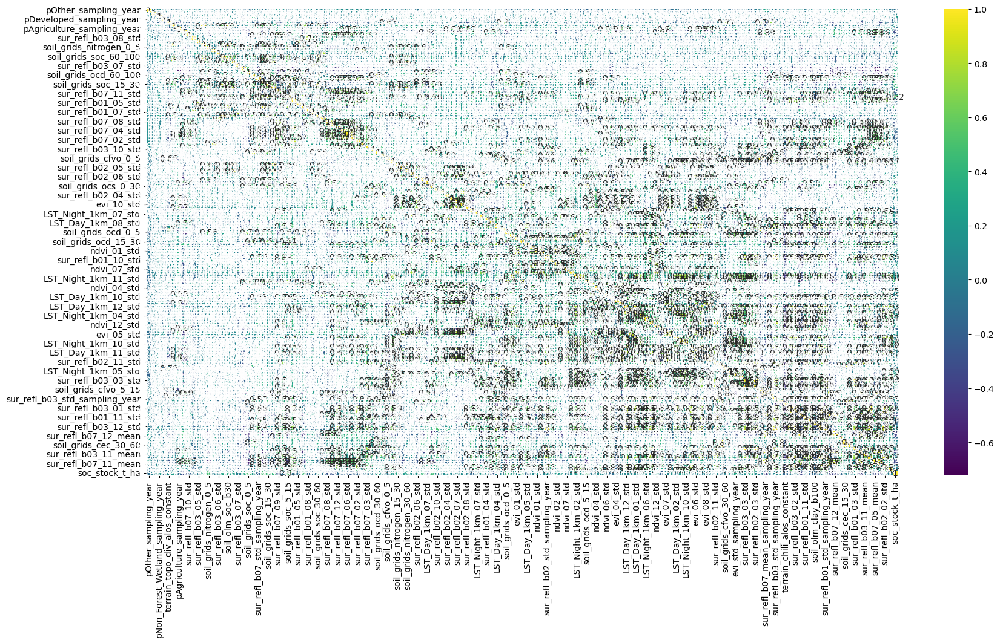

In [5]:
# correlation heatmap
plt.figure(figsize=[20,10])
sns.heatmap(final_df.corr(), annot = True, cmap = 'viridis')

### As can be seen, 'improved' heatmap in terms of multicollinearity

### Let's see the relationship beteen target variable and other variables

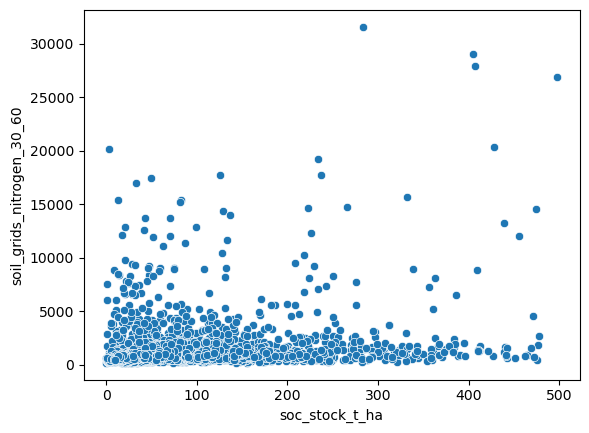

In [30]:
sns.scatterplot(x=df['soc_stock_t_ha'],y=df['soil_grids_nitrogen_30_60'])
plt.show()

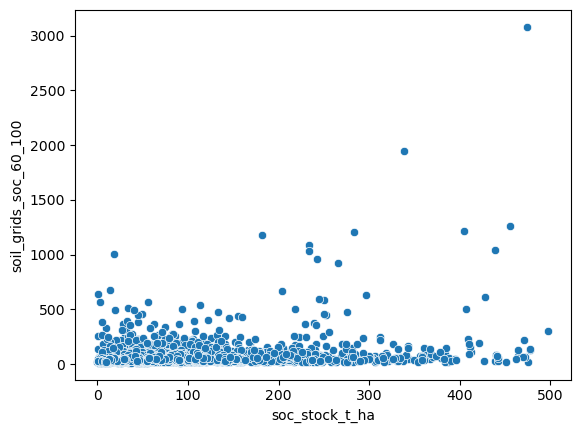

In [31]:
sns.scatterplot(x=df['soc_stock_t_ha'],y=df['soil_grids_soc_60_100'])
plt.show()

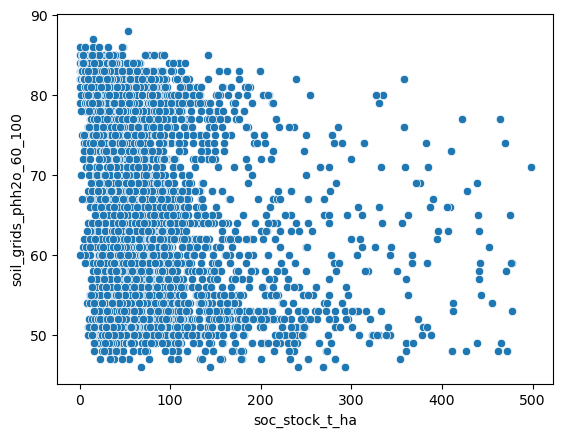

In [32]:
sns.scatterplot(x=df['soc_stock_t_ha'],y=df['soil_grids_phh2o_60_100'])
plt.show()

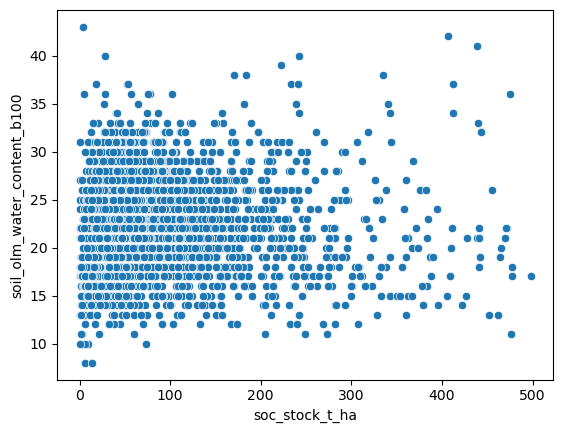

In [33]:
sns.scatterplot(x=df['soc_stock_t_ha'],y=df['soil_olm_water_content_b100'])
plt.show()

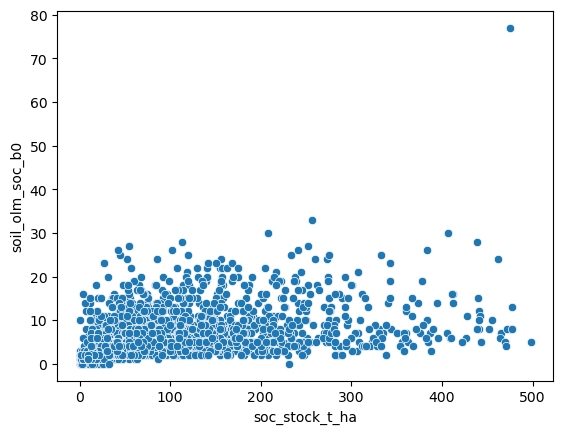

In [34]:
sns.scatterplot(x=df['soc_stock_t_ha'],y=df['soil_olm_soc_b0'])
plt.show()

### Let's take a look at Box plot for data points distribution of some features

<AxesSubplot:xlabel='ndvi_12_std'>

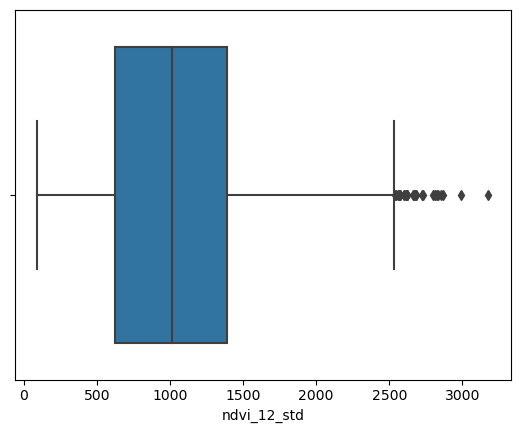

In [35]:
sns.boxplot(x = df['ndvi_12_std'])

<AxesSubplot:xlabel='soil_grids_soc_15_30'>

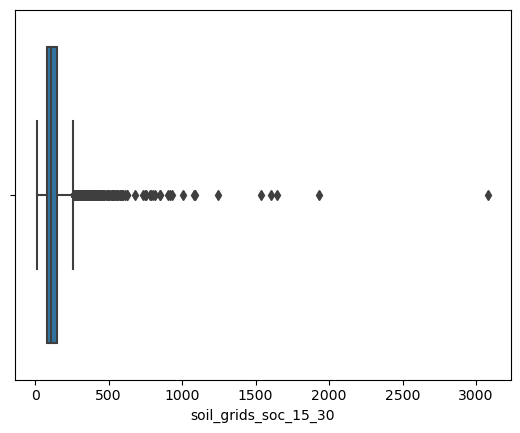

In [36]:
sns.boxplot(x = df['soil_grids_soc_15_30'])

<AxesSubplot:xlabel='soil_olm_bd_b60'>

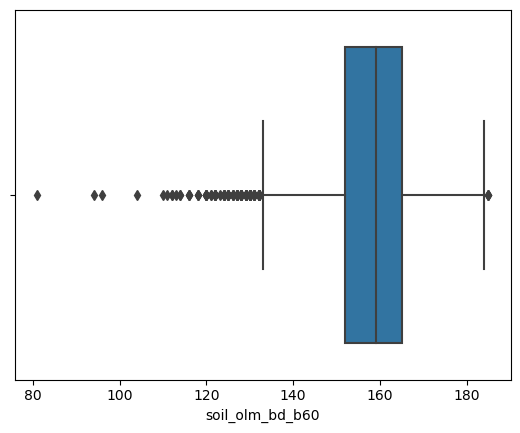

In [37]:
sns.boxplot(x = df['soil_olm_bd_b60'])

### There  are so many outliers present in the data

# Feature Scaling

# Splitting the data into train and test 

In [28]:
x=final_df.iloc[:,:-1].values
y=final_df.iloc[:,-1].values

In [42]:
# Split the dataset into training and testing
X_train, X_test, Y_train, Y_test=train_test_split(X,Y,test_size=0.2,random_state=4)

In [30]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(4072, 150)
(1019, 150)
(4072,)
(1019,)


In [43]:
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)

# we must apply the scaling to the test set as well that we are computing for the training set
X_test_scaled = scaler.transform(X_test)

# Linear Regression

In [44]:
# Performing Linear Regression
reg=LinearRegression()
reg.fit(X_train_scaled, Y_train)

LinearRegression()

In [45]:
Y_pred=reg.predict(X_test_scaled)

In [46]:
# Evaluate the model using MSE, RMSE and R square

MSE=metrics.mean_squared_error(Y_test, Y_pred)
print(MSE)

RMSE=np.sqrt(MSE)
print(RMSE)

R2=metrics.r2_score(Y_test,Y_pred)
print(R2)

3218.1098324950976
56.72838647886169
0.30068842348653957


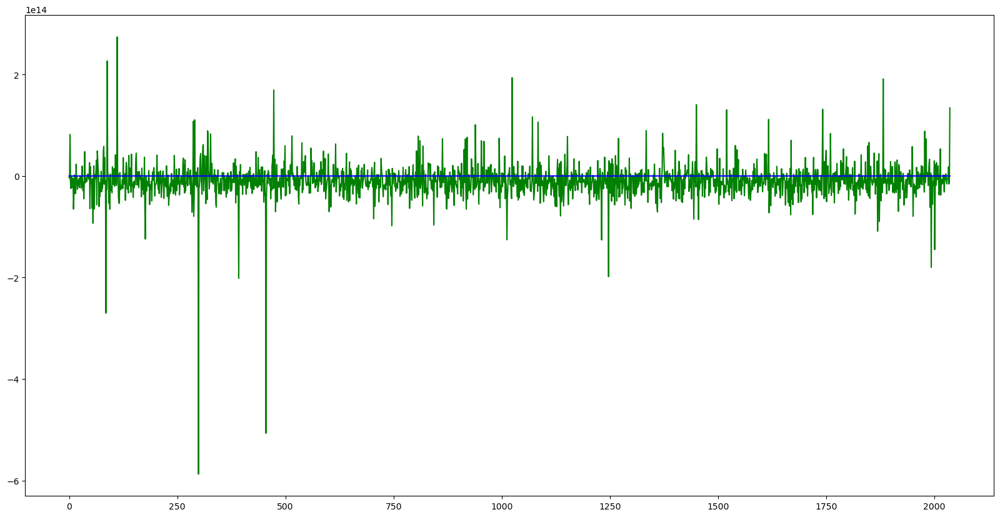

In [65]:
plt.figure(figsize=[20,10])
plt.plot(Y_pred,color='g')
plt.plot(Y_test,color='b')

# Polynomial Regression 

In [47]:
poly = PolynomialFeatures(degree = 2)
X_poly = poly.fit_transform(X_train_scaled)

poly.fit(X_poly, Y_train)
lin2 = LinearRegression()
lin2.fit(X_poly, Y_train)

LinearRegression()

In [48]:
X_test_poly = poly.fit_transform(X_test)
Y_pred=lin2.predict(X_test_poly)

In [49]:
# Evaluate the model using MSE, RMSE and R square

MSE=metrics.mean_squared_error(Y_test, Y_pred)
print(MSE)

RMSE=np.sqrt(MSE)
print(RMSE)

R2=metrics.r2_score(Y_test,Y_pred)
print(R2)

1.2668050023741767e+27
35592204235958.42
-2.752831473929419e+23


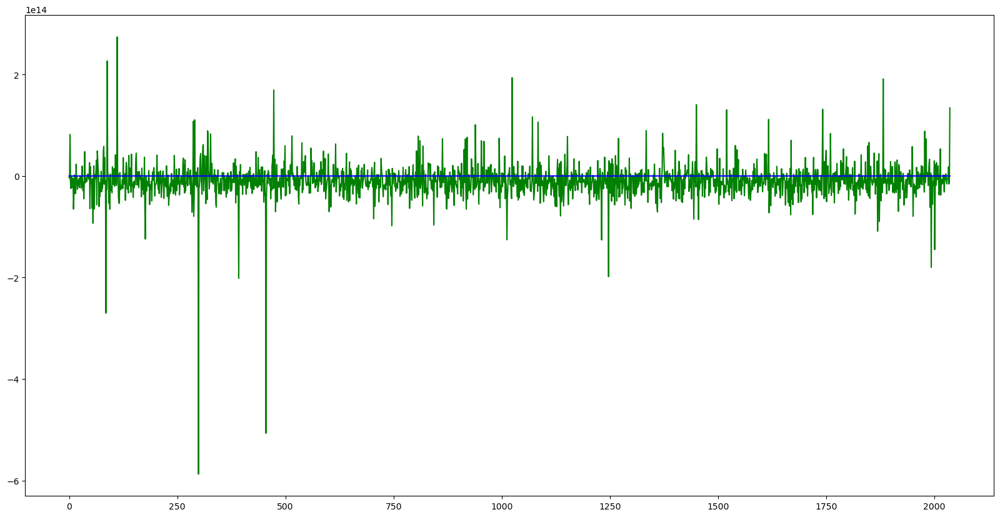

In [64]:
plt.figure(figsize=[20,10])
plt.plot(Y_pred,color='g')
plt.plot(Y_test,color='b')

# Decision Tree Regressor

In [56]:
# Fitting the decision tree regression
regr = DecisionTreeRegressor(max_depth=5)
regr.fit(X_train, Y_train)

DecisionTreeRegressor(max_depth=5)

In [59]:
# Making prediction
y = regr.predict(X_test)

In [60]:
# Evaluate the model using MSE, RMSE and R square

MSE=metrics.mean_squared_error(Y_test, y)
print(MSE)

RMSE=np.sqrt(MSE)
print(RMSE)

R2=metrics.r2_score(Y_test,y)
print(R2)

3834.7959430753003
61.92572924944284
0.16667940619037402


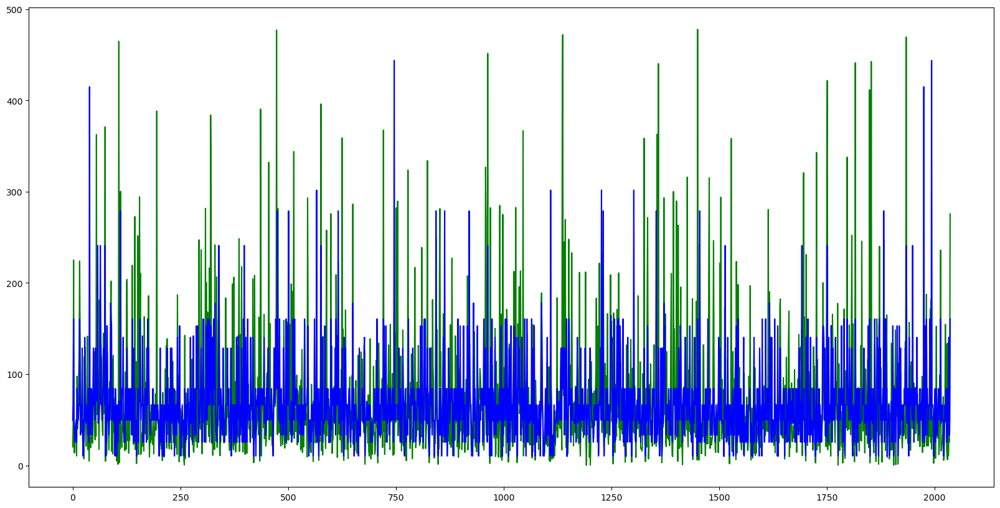

In [63]:
plt.figure(figsize=[20,10])
plt.plot(Y_test,color='g')
plt.plot(y,color='b')

# Comparison 


## MSE
Linear Regression - 3218.10

Polynumial Regression - 1.26

Decision Tree Regression - 3834.79
## RMSE
Linear Regression - 56.72

Polynumial Regression - 3559

Decision Tree Regression - 61.92
## Accuracy
Linear Regression - 0.30

Polynumial Regression - -2.75

Decision Tree Regression - 0.16


#### For further improvement of model, I am trying PCA, Linear, Ridge and LASSo regression on scaled data

# Pricipal Component Analysis

In [70]:
from sklearn.decomposition import PCA
pca = PCA()
X_train_PCA = pca.fit_transform(X_train_scaled)


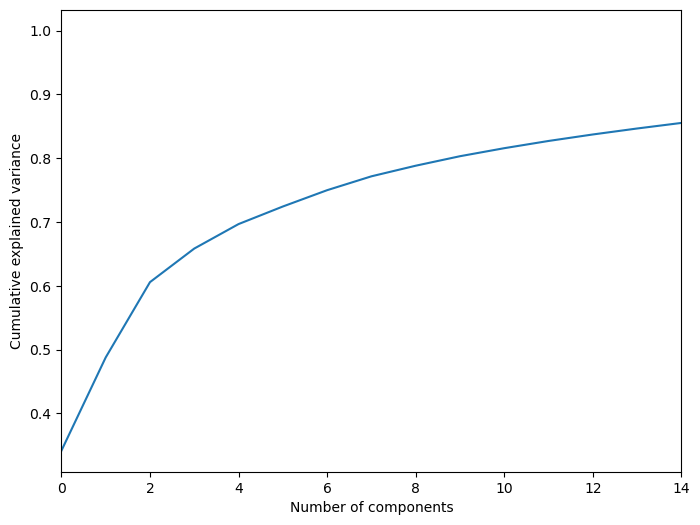

In [71]:
plt.figure(figsize=(8,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0,14,1)
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.show()

### The graph depicts, as number of components will increase model performance will increase 

In [90]:
df_pca = df[['pOther_sampling_year', 'terrain_mtpi_alos_AVE',
       'pNon_Forest_Wetland_sampling_year', 'pDeveloped_sampling_year',
       'terrain_topo_div_alos_constant', 'soil_olm_soc_b100',
       'pAgriculture_sampling_year',
       'pRangeland_or_Pasture_sampling_year', 'sur_refl_b07_10_std','sur_refl_b03_08_std', 'sur_refl_b03_05_std', 'soil_olm_soc_b60',
       'soil_grids_nitrogen_0_5','soc_stock_t_ha']]

In [103]:
x1=X_train_PCA
y1=Y_train
X_test_PCA = pca.transform(X=X_test_scaled)

In [92]:
print(X_train1.shape)
print(X_test1.shape)
print(Y_train1.shape)
print(Y_test1.shape)


(4072, 13)
(1019, 13)
(4072,)
(1019,)


# Linear Regression on PCA transformed data

In [104]:
# Performing Linear Regression
reg=LinearRegression()
reg.fit(x1, y1)

LinearRegression()

In [105]:
Y_pred1=reg.predict(X_test_PCA)

In [107]:
# Evaluate the model using MSE, RMSE and R square

MSE=metrics.mean_squared_error(Y_test, Y_pred1)
print(MSE)

RMSE=np.sqrt(MSE)
print(RMSE)

R2=metrics.r2_score(Y_test,Y_pred1)
print(R2)

3218.109832495097
56.72838647886169
0.3006884234865397


## On PCA transformed data Linear Regression - 30%

In [110]:
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso

In [111]:
# Performing Linear Regression
reg=LinearRegression()
reg.fit(x1, y1)

LinearRegression()

In [112]:
ridge = Ridge(alpha=.3)

ridge.fit(x1,y1)

print ("Ridge model:", (ridge.coef_))

Ridge model: [   1.32832868  -40.16116088  -19.4126422     8.87147341   -3.61161832
    2.34046881   16.82041797    2.11950901   -8.27336935   14.60429482
  -24.30016531   33.11573854  118.18635027   40.66670406   37.41504709
    0.58769817    6.53798093    6.17219129  -25.11448114   16.61360934
    1.81872762    6.79278373   36.26882373    6.76987635  -21.24426327
   -4.80564132   -8.02131051   14.06368274    3.36204934    2.41627682
  -33.59897401  -22.40266982  -10.39510803   28.70997065  -10.65284295
    2.17717016  -31.79843009   45.474686     42.34834596  -20.89537386
   39.67051095   15.24338001    5.41604743  -13.36670068   38.84055109
  -46.19165843   -5.34157632   -2.14691999   24.5757592    24.39466539
  -10.05518256   -3.03420487   23.53058985  -23.35214404   -4.90692684
  -17.41697984   29.47378757    6.64174168   20.08884984   32.93264859
  -24.37004297   26.0890543     4.21450191   -8.75059187  -10.69263875
    1.97137547   -3.09334555   -2.68213896   -9.7078621   -15.69

In [114]:
print("Ridge Regression Model Testing Score: ",ridge.score(X_test_PCA, Y_test))

Ridge Regression Model Testing Score:  0.3119864144336617


In [115]:
lasso = Lasso(alpha=0.1)

lasso.fit(x1,y1)

print ("Lasso model:", (lasso.coef_))

Lasso model: [ 1.24741544e+00 -3.99796111e+01 -1.91830477e+01  8.35114473e+00
 -2.89420174e+00  1.33922624e+00  1.57582599e+01  8.51011187e-01
 -6.62481221e+00  1.27752516e+01 -2.21571850e+01  3.07552044e+01
  1.15786998e+02  3.78324624e+01  3.43681413e+01  0.00000000e+00
  2.23857229e+00  1.78413430e+00 -2.07271534e+01  1.18321465e+01
  0.00000000e+00  7.83168002e-01  3.00993501e+01  0.00000000e+00
 -1.42347756e+01 -0.00000000e+00 -1.07403672e-01  5.54463112e+00
  0.00000000e+00  0.00000000e+00 -2.40596866e+01 -1.18223003e+01
 -0.00000000e+00  1.71626238e+01 -0.00000000e+00  0.00000000e+00
 -1.85287858e+01  3.20096402e+01  2.80305455e+01 -5.93257257e+00
  2.43022380e+01  0.00000000e+00  0.00000000e+00 -0.00000000e+00
  2.12988382e+01 -2.71402454e+01 -0.00000000e+00 -0.00000000e+00
  3.27125838e+00  2.95657104e+00 -0.00000000e+00 -0.00000000e+00
  0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
  3.30414586e+00  0.00000000e+00  0.00000000e+00  4.04935750e+00
 -0.00000000

In [116]:
print("Lasso Regression Model Testing Score: ",lasso.score(X_test_PCA, Y_test))

Lasso Regression Model Testing Score:  0.3119990008104204


#### After trying PCA, Linear, Ridge and LASSO 31%